# Input Output Tests with Extended Waveset
To verify whether or not our amplitude model can handle higher order $J^P \ell$ partial waves, we can try fitting a Monte Carlo dataset that only contains a $b_1(1235)$ and $\rho(1450)$ (which we know previously to appear in the $S_0^{(+)}$ and $P_1^{(+)}$ partial waves). We of course then expect all other partial waves to be near 0. 

This procedure is better understood by employing a "bootstrapping" method. Once we have obtained the nominal fit parameters from performing repeated randomized fits, we perform another 100 fits all starting at the nominal fit parameters. Each bootstrap fit randomly samples the original dataset with replacement, and in doing so we can plot the distribution of those 100 fits for each fit parameter to get an estimate of its error. This is most easily visualized in a *grid plot* where the histograms, scatter plots, and kernel density estimations (kde's) show the distributions and relations of the data.

In practice we'll want to use the standard deviations of the bootstrap fits to obtain the uncertainties, but this file will be studying whether the standard deviation is a good metric to use

TODO:
* Bootstrap fits in a single bin can be compared across wavesets. So I can use the `hues` keyword to compare the distribution of fit results between the $J^P=\{0^-,1^+,1^-\}$ and $J^P=\{0^-,1^+,1^-,2^+\}$ dataset. I can also color the *nominal* and *generated* values by their hue colors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math

from pathlib import Path    
import sys, os
parent_dir = str(Path().resolve().parents[1])
sys.path.insert(0, parent_dir)
import analysis.scripts.pwa_tools as pwa_tools

# change some plot parameters to look better
plt.rcParams["figure.figsize"] = (10, 8)
plt.rcParams["figure.dpi"] = 500
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["legend.fontsize"] = 16
plt.rcParams["xtick.major.width"] = 2.0
plt.rcParams["xtick.minor.width"] = 1.8
plt.rcParams["ytick.major.width"] = 2.0
plt.rcParams["ytick.minor.width"] = 1.8
plt.rcParams["lines.markersize"] = 10 # bumped down from normal due to large mass range

## Prepare Data

In [2]:
path = f"{parent_dir}/analysis/data/io_extended_waveset_test"

df = pd.read_csv(f"{path}/best_fits.csv", index_col="index")
df_data = pd.read_csv(f"{path}/data.csv")

# TEMP: the 1.6-1.62 bin just refuses to get a converged fit
df_data = df_data[df_data["mass_low_edge"] != 1.6]

df_bootstrap = pd.read_csv(f"{path}/bootstrap-fits_t_0.30-0.50.csv")
df_bootstrap["bin"].astype("int8")

MASS_BINS = df_data["mass_mean"]
bin_width = (df_data["mass_high_edge"] - df_data["mass_low_edge"])[0]

# create the plotter object
plotter = pwa_tools.Plotter(df, df_data, df_bootstrap)

## Analysis

### Non-bootstrap Plots

Lets first take a look at some of the standard plots from the fit results to see how they perform across the mass range

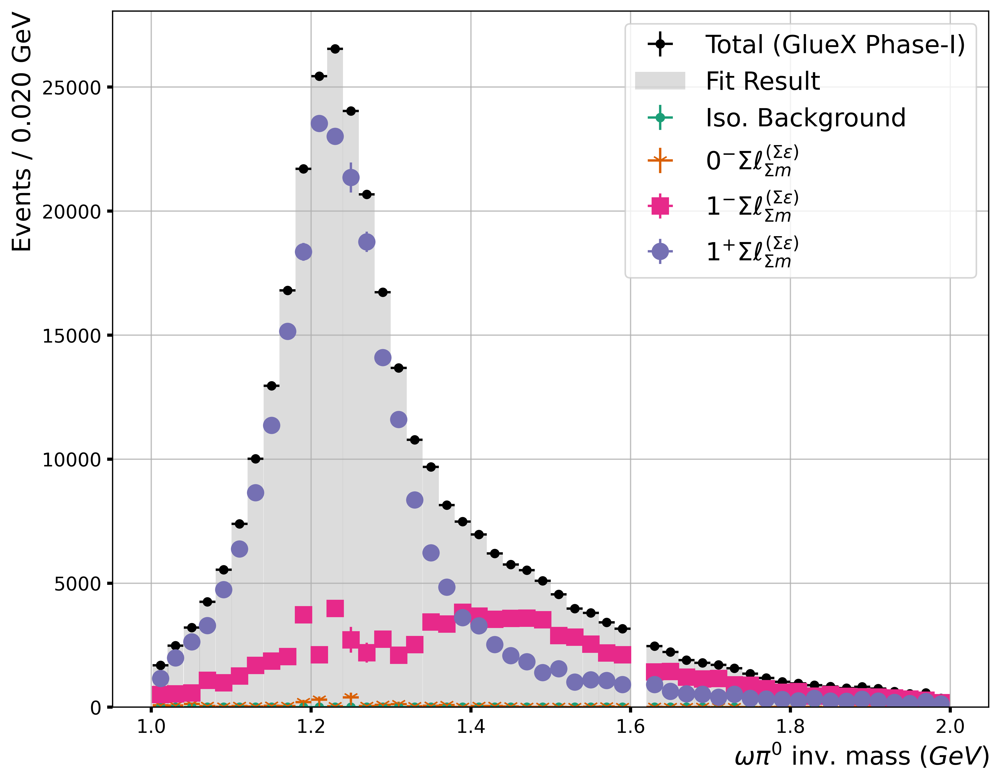

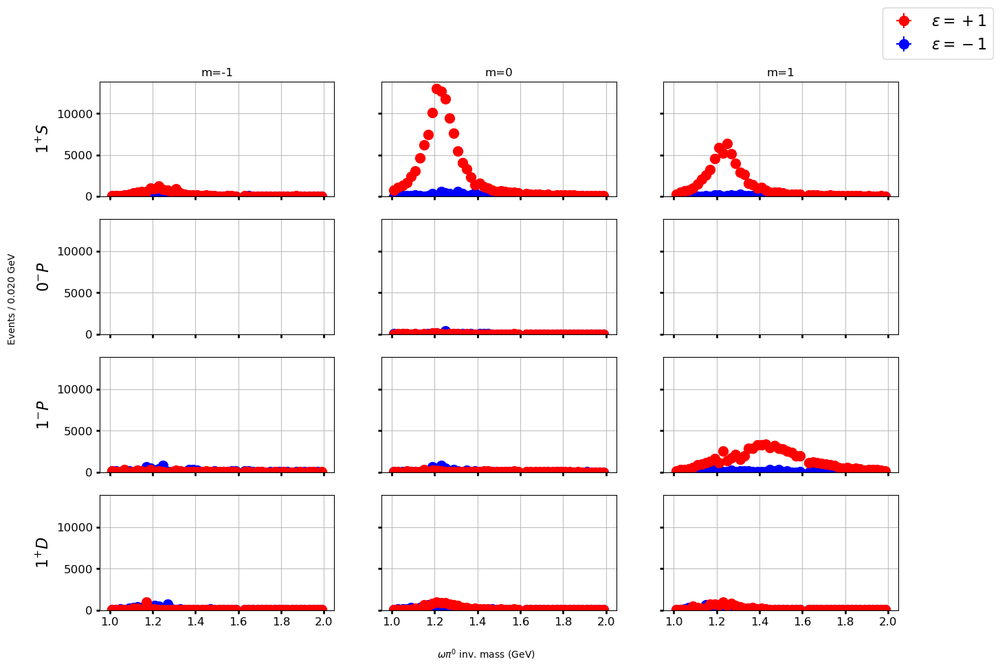

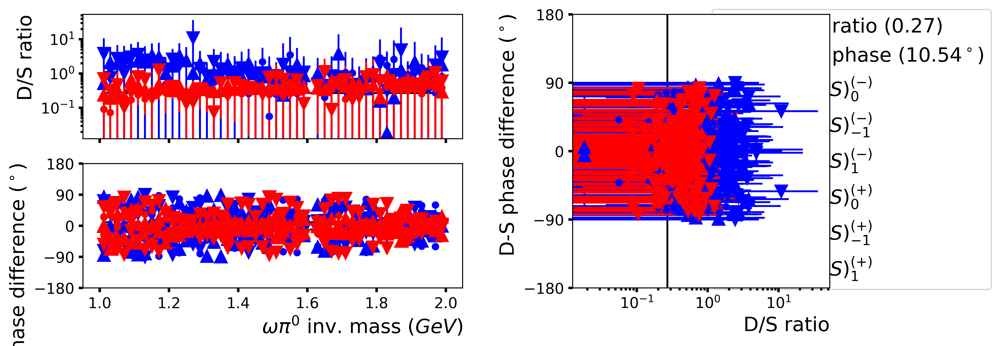

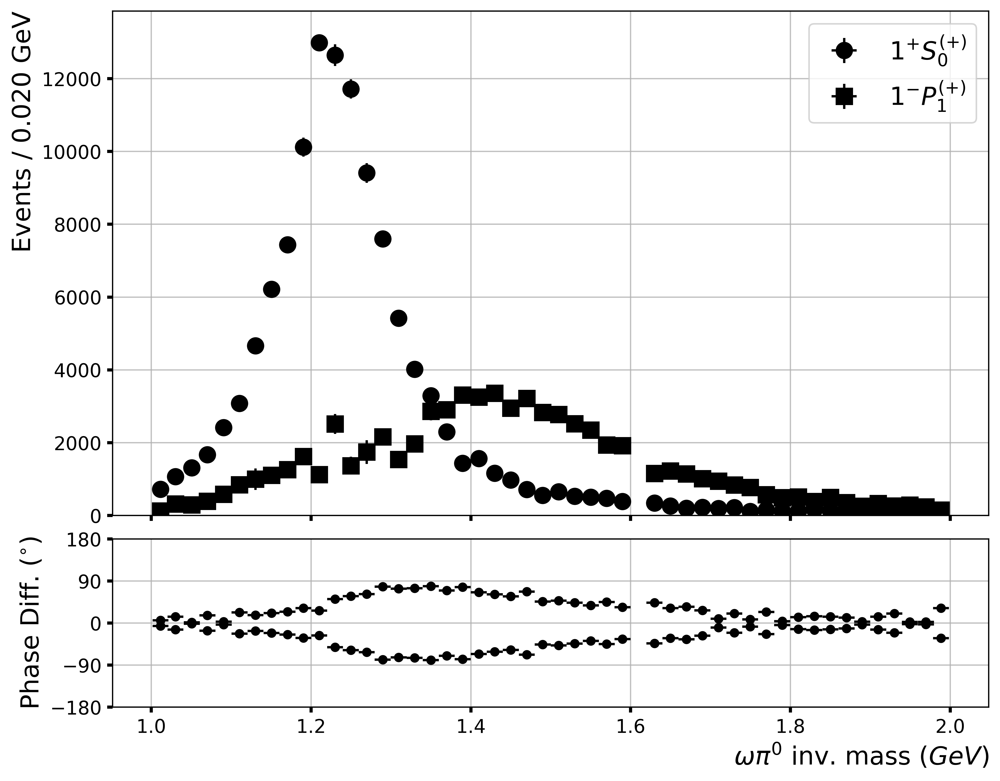

In [19]:
plotter.jp()
plotter.intensities()
plotter.ds_ratio()
plotter.mass_phase("p1p0S", "p1mpP")

Things seem to look okay for the most part, lets employ the power of our bootstrap fits to see if our main results (the $1^+ S_0^{(+)}$ and $1^- P_1^{(+)}$ interaction) has any correlations or issues. Lets pick 4 mass bins across the range to sample this.

### The 3 Problem Mass Bins
Clearly 2 mass bins are having issues, $m=[1.18-1.20]$ and $m=[1.22-1.24]$, though the mass bin between them looks fine. The angular distributions all look fine, and the rand fit diagnostics show that all other randomized fits are at least 1 unit of likelihood away with higher $\chi^2$ values. At this point lets check the correlations to see if any parameters in particular are the source of the instabilities here

### Bootstrap Plots

OLD BELOW THIS POINT

In [ ]:
coherent_sums = plotter._coherent_sums
plotter.bootstrap_matrix(11, [x for x in coherent_sums["eJPmL"] if x[1:3]=="0m"])
plotter.bootstrap_matrix(11, [x for x in coherent_sums["eJPmL"] if x[1:3]=="1m"])
cols = [x for x in coherent_sums["eJPmL"] if x[1:3]=="1p"]
plotter.bootstrap_matrix(11, cols)

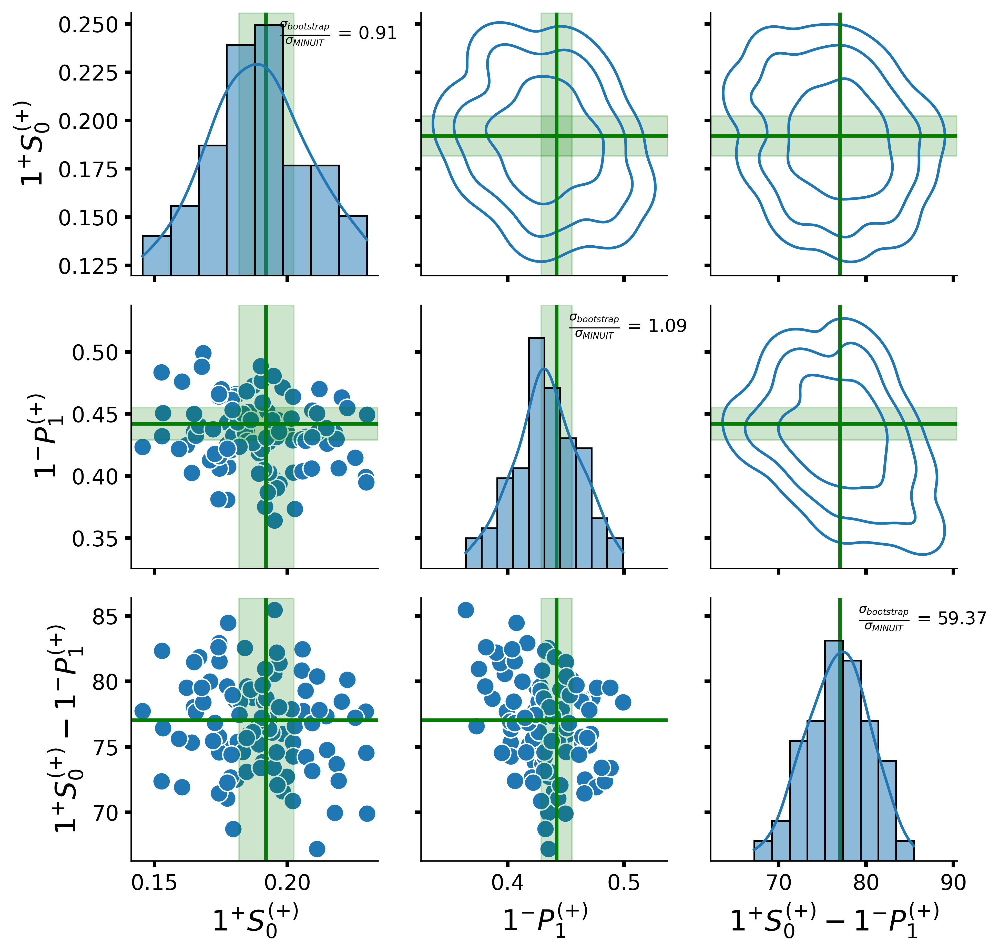

In [6]:
plotter.bootstrap_matrix(19, ["p1p0S", "p1mpP", plotter._phase_differences[("p1p0S", "p1mpP")]])

### Other Plots
Unique ones we make ourselves

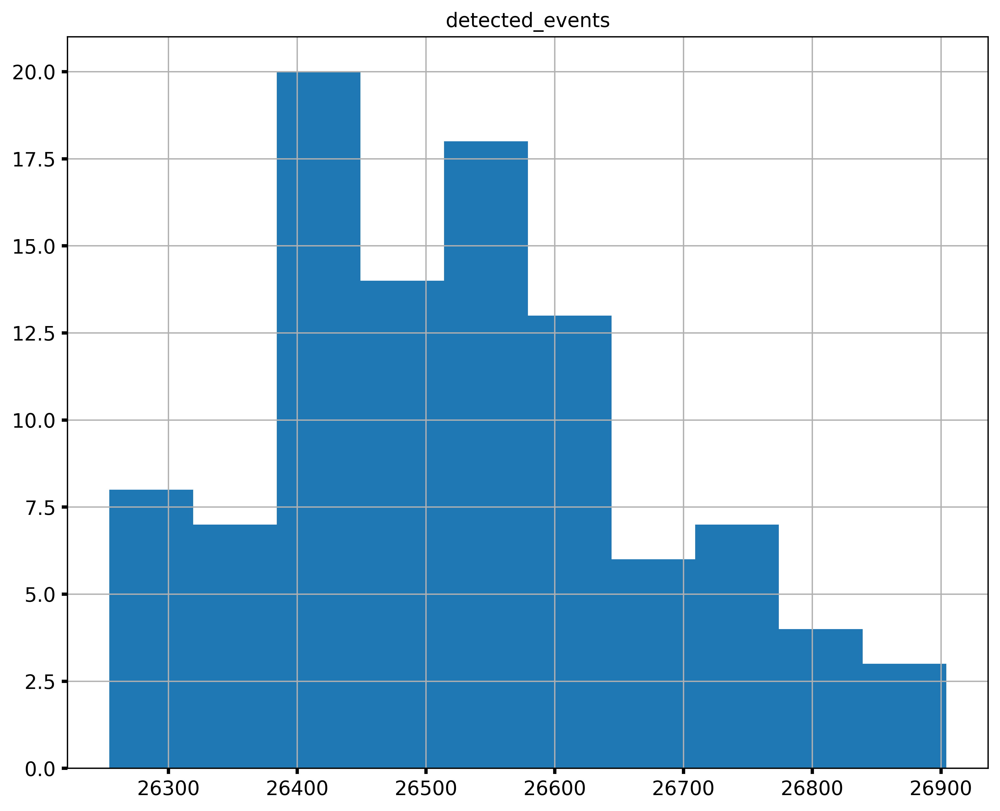

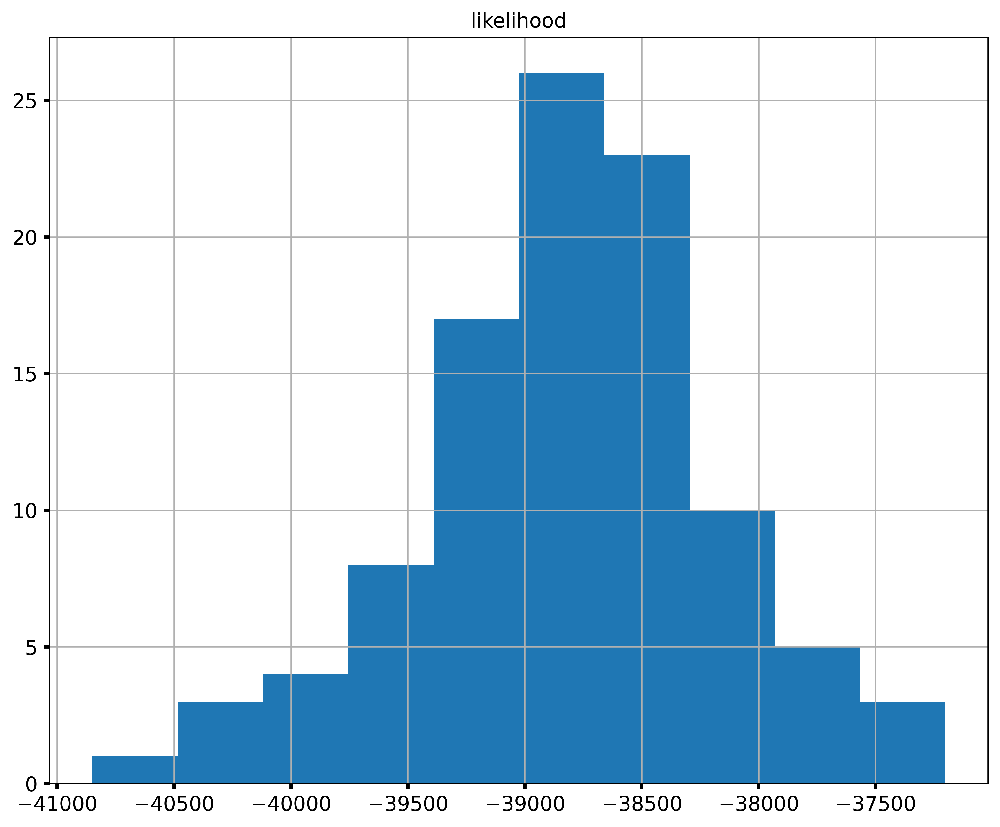

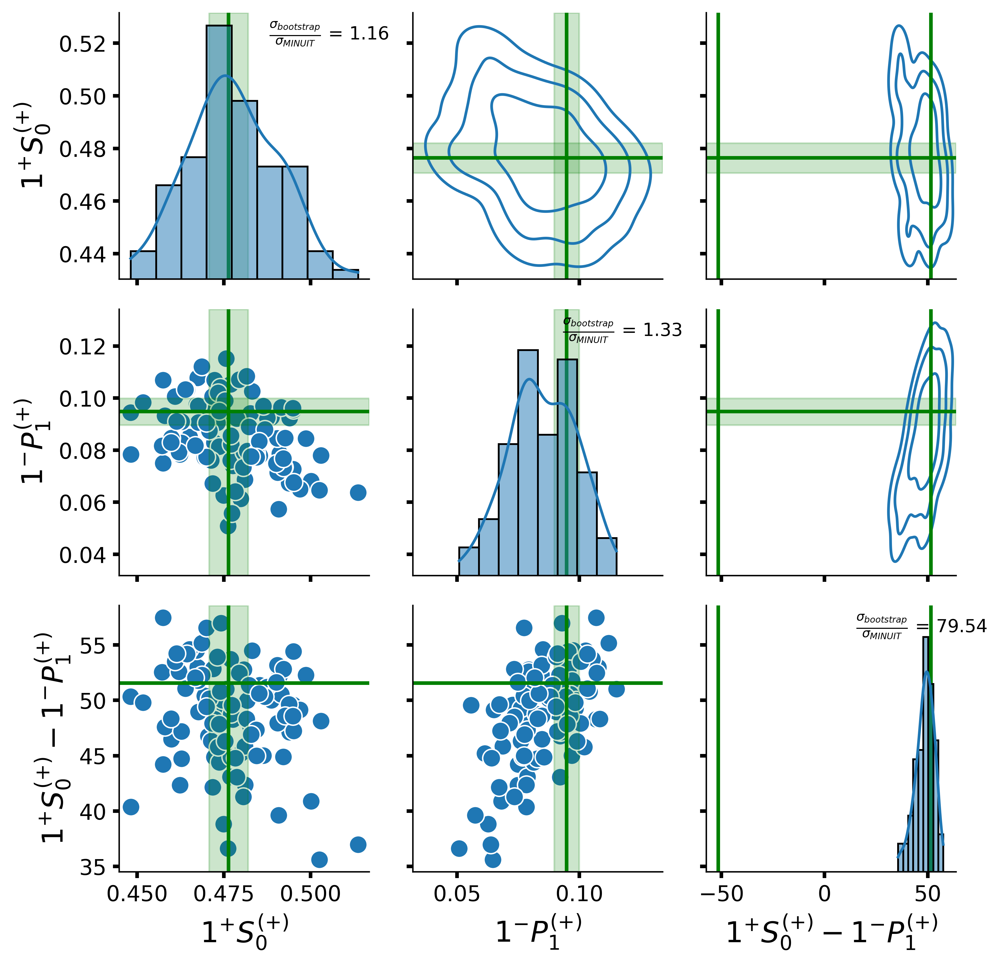

0       18.651151
1        9.569427
2        8.876606
3       20.619892
4       12.462119
          ...    
4895    25.036021
4896    59.949720
4897    -1.821284
4898    36.512137
4899    16.562491
Name: p1p0S_p1mpP, Length: 4900, dtype: float64


In [6]:
# distribution of likelihood and detected_events 
df_bootstrap[df_bootstrap["bin"]==11].hist("detected_events")
plt.show()
df_bootstrap[df_bootstrap["bin"]==11].hist("likelihood")
plt.show()

plotter.bootstrap_matrix(11, [x for x in coherent_sums["eJPmL"] if x[3]=="0"])

print(df_bootstrap[plotter._phase_differences[("p1p0S", "p1mpP")]])